In [1]:
import pandas as pd

building_data = pd.read_csv("/content/building_data (1).csv")
climate_data = pd.read_csv("/content/climate_data (2).csv")
target_data = pd.read_csv("/content/target_labels (1).csv")

In [2]:
building_data

,Building_Material,Insulation,Age,HVAC_System,Window_Type,Roof_Type,Floor_Area,Energy_Efficiency_Rating,Occupancy_Type
0,Steel,0.613250,49,Central Heating,Single Pane,Pitched,1419.051758,4.395430,Commercial
1,Brick,0.867391,4,Radiant Heating,Double Pane,Flat,3613.850830,4.992798,Residential
2,Brick,0.887751,12,Heat Pump,Single Pane,Flat,3252.907448,3.420983,Residential
3,Wood,0.937971,7,Radiant Heating,Triple Pane,Shingle,3152.905900,1.625558,Commercial
4,Concrete,0.841316,27,Heat Pump,Double Pane,Flat,4222.796264,2.669320,Commercial
...,...,...,...,...,...,...,...,...,...
49995,Concrete,0.948080,4,Central Heating,Single Pane,Pitched,735.369715,3.139388,Residential
49996,Steel,0.939274,6,Radiant Heating,Double Pane,Flat,1062.617625,1.369629,Residential
49997,Concrete,0.852208,48,Heat Pump,Triple Pane,Pitched,743.044134,3.450355,Commercial
49998,Wood,0.856012,42,Radiant Heating,Single Pane,Pitched,1791.667545,4.344887,Industrial


In [3]:
climate_data

,Outdoor_Temperature,Humidity,Air_Quality_Index,Precipitation,Wind_Speed,Sunlight_Exposure,Geographical_Location,Elevation
0,4.911492,61.838539,36,5.690269,8.059475,3.113824,Rural,1009.100317
1,10.958669,25.791698,12,0.943721,13.522032,1.177461,Suburban,135.325209
2,27.907085,53.141518,16,1.570476,3.479507,0.069337,Suburban,1426.739715
3,25.473067,72.314763,36,3.241766,18.428306,0.574430,Suburban,1645.069144
4,37.017177,74.917113,19,5.185848,2.842883,4.991084,Rural,1250.315789
...,...,...,...,...,...,...,...,...
49995,34.505579,57.283676,73,3.201781,4.297367,9.414713,Urban,1200.309098
49996,4.909992,34.464663,31,6.790262,14.503924,5.536800,Rural,626.034896
49997,0.952129,65.984300,60,5.874553,18.134413,1.603176,Suburban,1990.561954
49998,38.988595,54.927447,81,6.086289,12.081279,5.936447,Suburban,471.733529


In [4]:
target_data

,Climate_Impact
0,Negative
1,Negative
2,Negative
3,Negative
4,Negative
...,...
49995,Negative
49996,Negative
49997,Positive
49998,Negative


In [5]:
building_data['artificial_key'] = range(len(building_data))
climate_data['artificial_key'] = range(len(climate_data))
target_data['artificial_key'] = range(len(target_data))

combined_df = pd.merge(building_data, climate_data, on='artificial_key', how='outer')
combined_df = combined_df.merge(target_data, on='artificial_key', how='outer')

combined_df.fillna(method='ffill', inplace=True)

print(combined_df)

      Building_Material  Insulation  Age      HVAC_System  Window_Type  \
0                 Steel    0.613250   49  Central Heating  Single Pane   
1                 Brick    0.867391    4  Radiant Heating  Double Pane   
2                 Brick    0.887751   12        Heat Pump  Single Pane   
3                  Wood    0.937971    7  Radiant Heating  Triple Pane   
4              Concrete    0.841316   27        Heat Pump  Double Pane   
...                 ...         ...  ...              ...          ...   
49995          Concrete    0.948080    4  Central Heating  Single Pane   
49996             Steel    0.939274    6  Radiant Heating  Double Pane   
49997          Concrete    0.852208   48        Heat Pump  Triple Pane   
49998              Wood    0.856012   42  Radiant Heating  Single Pane   
49999             Brick    0.682880   46  Radiant Heating  Double Pane   

      Roof_Type   Floor_Area  Energy_Efficiency_Rating Occupancy_Type  \
0       Pitched  1419.051758          

In [6]:
import pandas as pd

missing_values = combined_df.isnull().sum()

print("Columns with missing values:")
print(missing_values[missing_values > 0])

Columns with missing values:
Series([], dtype: int64)


In [7]:
combined_df.dtypes

Building_Material            object
Insulation                  float64
Age                           int64
HVAC_System                  object
Window_Type                  object
Roof_Type                    object
Floor_Area                  float64
Energy_Efficiency_Rating    float64
Occupancy_Type               object
artificial_key                int64
Outdoor_Temperature         float64
Humidity                    float64
Air_Quality_Index             int64
Precipitation               float64
Wind_Speed                  float64
Sunlight_Exposure           float64
Geographical_Location        object
Elevation                   float64
Climate_Impact               object
dtype: object

In [8]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
combined_df[['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Humidity']] = scaler.fit_transform(combined_df[['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Humidity']])

In [9]:
print(combined_df.isnull().sum())

Building_Material           0
Insulation                  0
Age                         0
HVAC_System                 0
Window_Type                 0
Roof_Type                   0
Floor_Area                  0
Energy_Efficiency_Rating    0
Occupancy_Type              0
artificial_key              0
Outdoor_Temperature         0
Humidity                    0
Air_Quality_Index           0
Precipitation               0
Wind_Speed                  0
Sunlight_Exposure           0
Geographical_Location       0
Elevation                   0
Climate_Impact              0
dtype: int64


In [10]:
print(combined_df.describe())

         Insulation           Age    Floor_Area  Energy_Efficiency_Rating  \
count  5.000000e+04  5.000000e+04  5.000000e+04              5.000000e+04   
mean   4.793321e-16 -1.162448e-16 -1.907452e-16             -1.261924e-16   
std    1.000010e+00  1.000010e+00  1.000010e+00              1.000010e+00   
min   -1.728600e+00 -1.691746e+00 -1.724970e+00             -1.732562e+00   
25%   -8.669784e-01 -8.619772e-01 -8.642733e-01             -8.630223e-01   
50%   -2.104645e-03 -3.220884e-02 -1.275834e-02             -2.361503e-03   
75%    8.625046e-01  8.667069e-01  8.707630e-01              8.601311e-01   
max    1.740236e+00  1.696475e+00  1.737507e+00              1.735635e+00   

       artificial_key  Outdoor_Temperature      Humidity  Air_Quality_Index  \
count    50000.000000         50000.000000  5.000000e+04       50000.000000   
mean     24999.500000            15.060450 -1.534950e-16          50.033160   
std      14433.901067            14.435422  1.000010e+00          29.

In [11]:
print(combined_df.groupby('Building_Material')['Elevation'].mean())

Building_Material
Brick       1000.112688
Concrete     992.958637
Steel       1004.595450
Wood        1002.140773
Name: Elevation, dtype: float64


Axes(0.125,0.11;0.775x0.77)


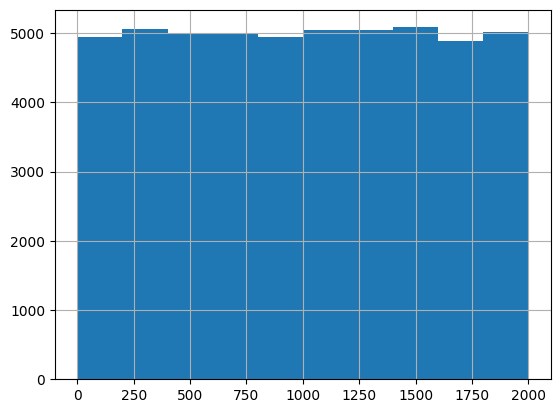

In [12]:
print(combined_df['Elevation'].hist())

In [13]:
print(combined_df.corr())

                          Insulation       Age  Floor_Area  \
Insulation                  1.000000  0.000069   -0.009782   
Age                         0.000069  1.000000   -0.004652   
Floor_Area                 -0.009782 -0.004652    1.000000   
Energy_Efficiency_Rating    0.001324 -0.007256    0.002494   
artificial_key              0.002739  0.005924   -0.001854   
Outdoor_Temperature         0.003715  0.002719   -0.005693   
Humidity                    0.000143  0.004971    0.007359   
Air_Quality_Index          -0.000783  0.003818    0.004730   
Precipitation              -0.005602 -0.003212   -0.000659   
Wind_Speed                 -0.000440  0.001317   -0.005359   
Sunlight_Exposure          -0.002463  0.004945   -0.002714   
Elevation                   0.004828  0.006078   -0.005242   

                          Energy_Efficiency_Rating  artificial_key  \
Insulation                                0.001324        0.002739   
Age                                      -0.007256   

<ipython-input-13-97fd6f45a67d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(combined_df.corr())


In [14]:
print(combined_df.columns)

Index(['Building_Material', 'Insulation', 'Age', 'HVAC_System', 'Window_Type',
       'Roof_Type', 'Floor_Area', 'Energy_Efficiency_Rating', 'Occupancy_Type',
       'artificial_key', 'Outdoor_Temperature', 'Humidity',
       'Air_Quality_Index', 'Precipitation', 'Wind_Speed', 'Sunlight_Exposure',
       'Geographical_Location', 'Elevation', 'Climate_Impact'],
      dtype='object')


In [15]:
print(combined_df['Elevation'].apply(lambda x: x - 15))

0         994.100317
1         120.325209
2        1411.739715
3        1630.069144
4        1235.315789
            ...     
49995    1185.309098
49996     611.034896
49997    1975.561954
49998     456.733529
49999    1691.822464
Name: Elevation, Length: 50000, dtype: float64


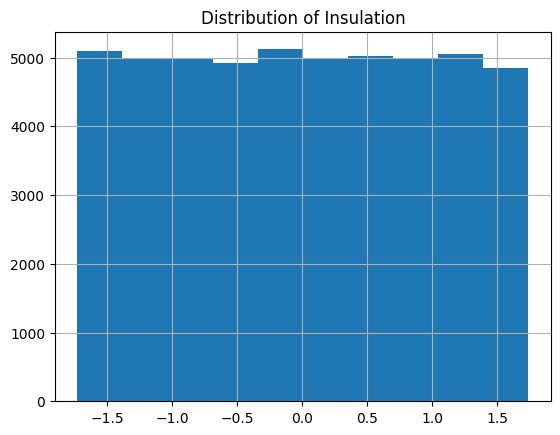

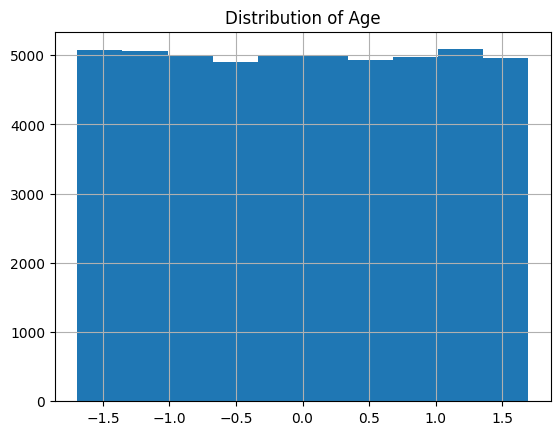

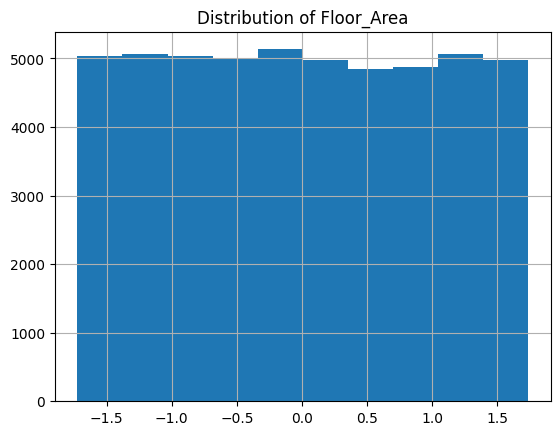

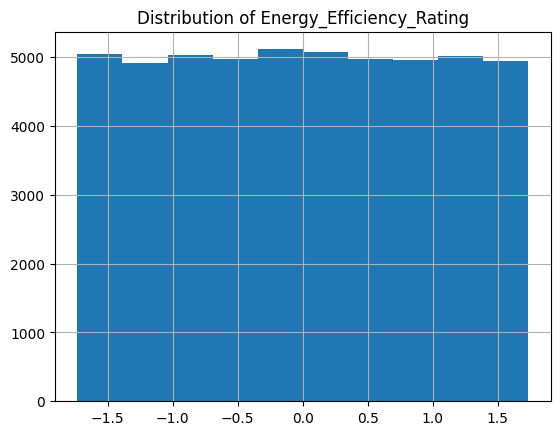

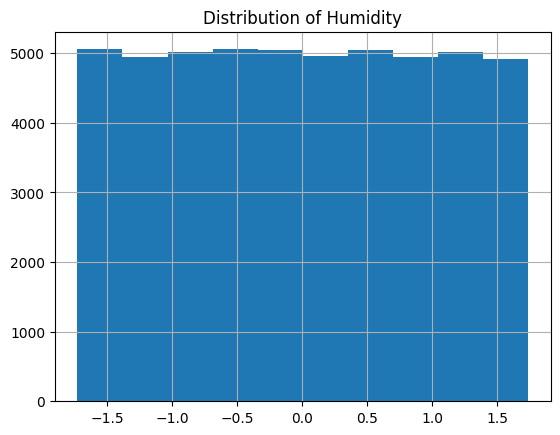

...

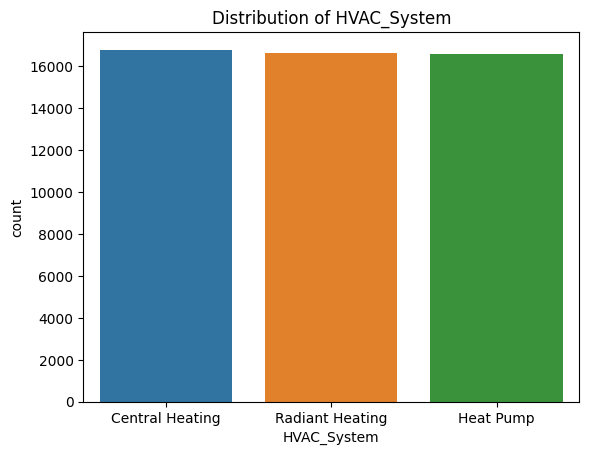

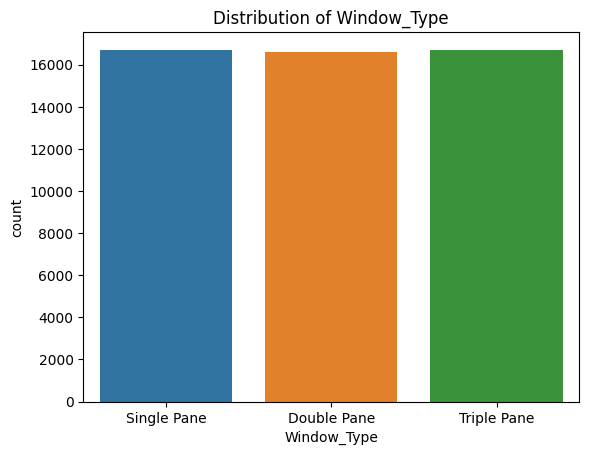

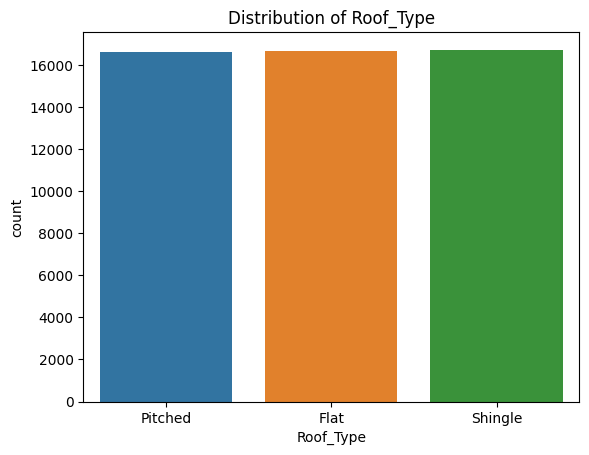

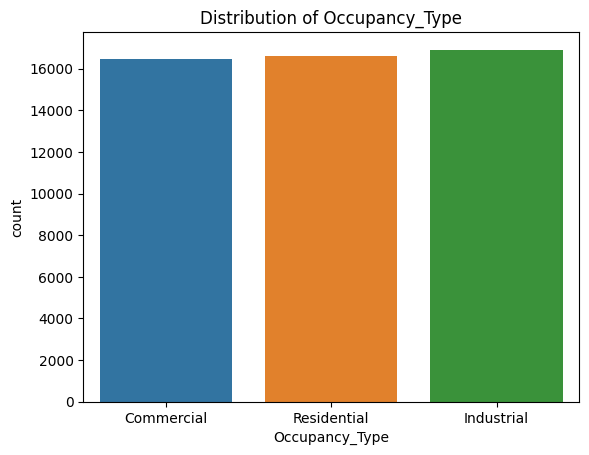

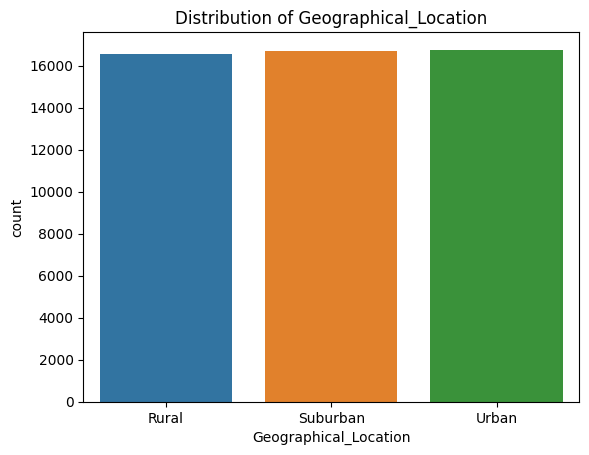

         Insulation           Age    Floor_Area  Energy_Efficiency_Rating  \
count  5.000000e+04  5.000000e+04  5.000000e+04              5.000000e+04   
mean   4.793321e-16 -1.162448e-16 -1.907452e-16             -1.261924e-16   
std    1.000010e+00  1.000010e+00  1.000010e+00              1.000010e+00   
min   -1.728600e+00 -1.691746e+00 -1.724970e+00             -1.732562e+00   
25%   -8.669784e-01 -8.619772e-01 -8.642733e-01             -8.630223e-01   
50%   -2.104645e-03 -3.220884e-02 -1.275834e-02             -2.361503e-03   
75%    8.625046e-01  8.667069e-01  8.707630e-01              8.601311e-01   
max    1.740236e+00  1.696475e+00  1.737507e+00              1.735635e+00   

       artificial_key  Outdoor_Temperature      Humidity  Air_Quality_Index  \
count    50000.000000         50000.000000  5.000000e+04       50000.000000   
mean     24999.500000            15.060450 -1.534950e-16          50.033160   
std      14433.901067            14.435422  1.000010e+00          29.

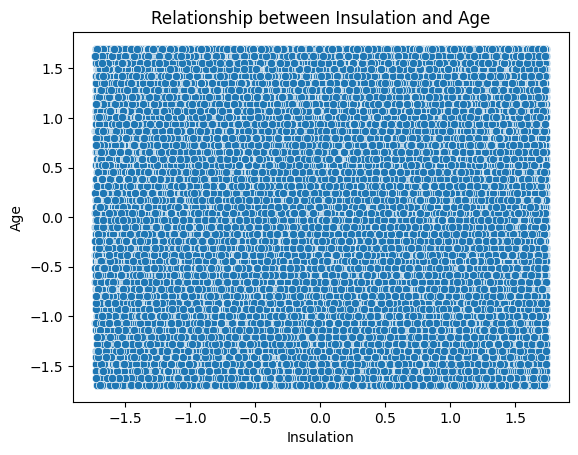

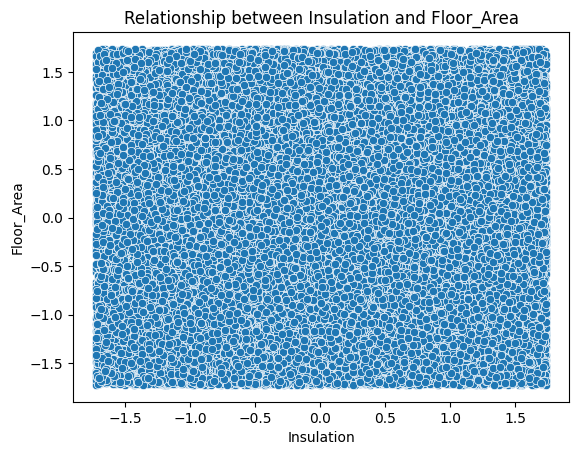

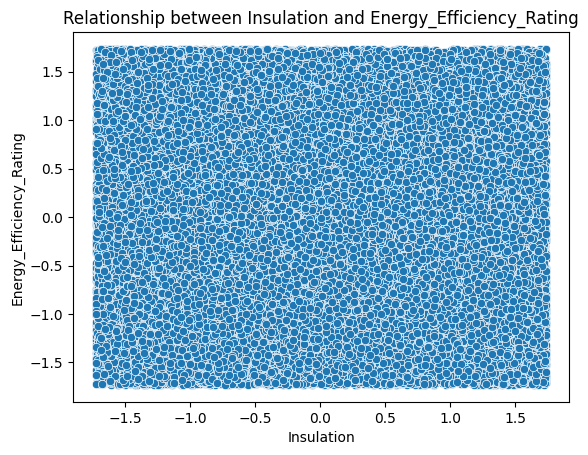

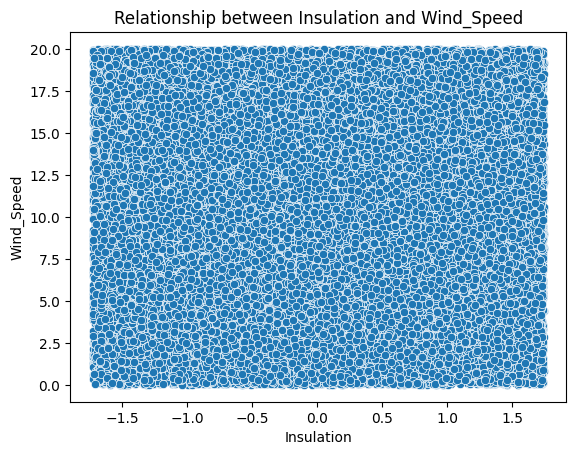

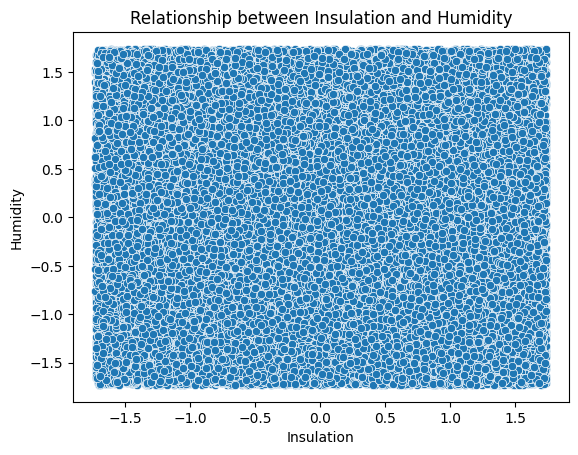

...

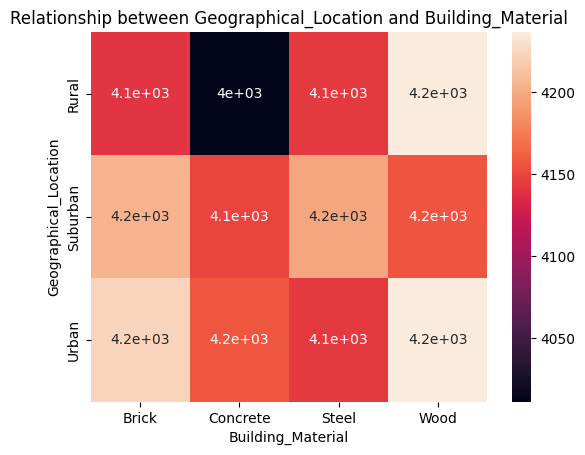

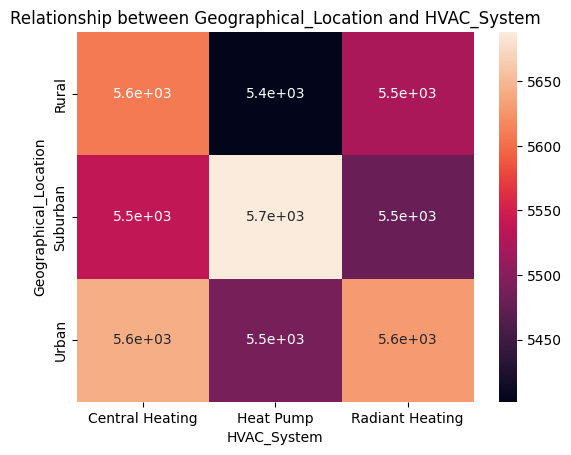

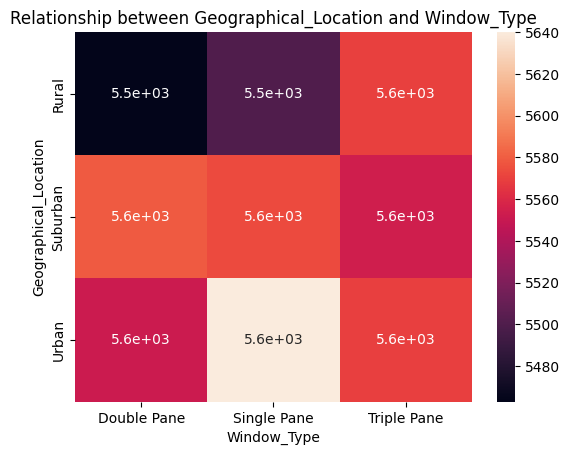

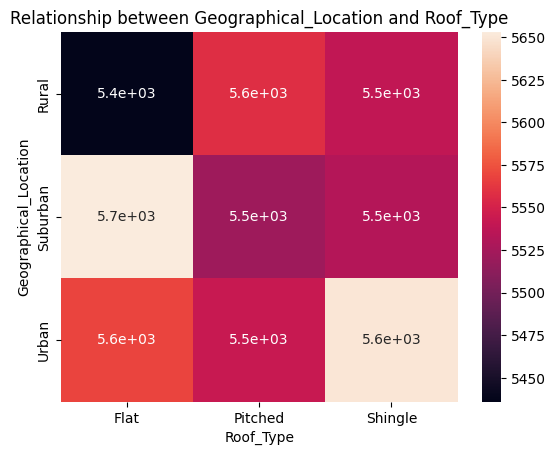

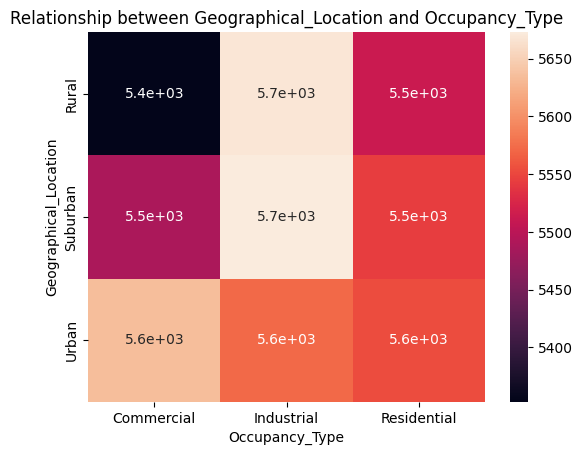

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

numerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Humidity']

for column in numerical_columns:
    combined_df[column].hist()
    plt.title(f'Distribution of {column}')
    plt.show()

categorical_columns = ['Building_Material', 'HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type', 'Geographical_Location']

for column in categorical_columns:
    sns.countplot(x=column, data=combined_df)
    plt.title(f'Distribution of {column}')
    plt.show()

print(combined_df.describe())

numerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Wind_Speed', 'Humidity']

for column1 in numerical_columns:
    for column2 in numerical_columns:
        if column1 != column2:
            sns.scatterplot(x=column1, y=column2, data=combined_df)
            plt.title(f'Relationship between {column1} and {column2}')
            plt.show()

categorical_columns = ['Building_Material', 'HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type', 'Geographical_Location']

for column in categorical_columns:
    for numerical_column in numerical_columns:
        sns.boxplot(x=column, y=numerical_column, data=combined_df)
        plt.title(f'Distribution of {numerical_column} by {column}')
        plt.show()

categorical_columns = ['Building_Material', 'HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type', 'Geographical_Location']

for column1 in categorical_columns:
    for column2 in categorical_columns:
        if column1 != column2:
            sns.heatmap(combined_df.groupby([column1, column2]).size().unstack(), annot=True)
            plt.title(f'Relationship between {column1} and {column2}')
            plt.show()


In [17]:
'''import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

irrelevant_features = ['Building_Material', 'Geographical_Location']
combined_df.drop(irrelevant_features, axis=1, inplace=True)

numerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Outdoor_Temperature', 'Humidity',
                    'Air_Quality_Index', 'Precipitation', 'Wind_Speed', 'Sunlight_Exposure', 'Elevation']

imputer = SimpleImputer(strategy='mean', missing_values=np.nan)
transformed_numerical_features = imputer.fit_transform(combined_df[numerical_columns])

categorical_columns = ['HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type']

onehotencoder = OneHotEncoder(handle_unknown='ignore')
transformed_categorical_features = onehotencoder.fit_transform(combined_df[categorical_columns])

transformed_features = np.concatenate((transformed_numerical_features, transformed_categorical_features.toarray()), axis=1)

scaler = StandardScaler()
standardized_features = scaler.fit_transform(transformed_features)'''


"import pandas as pd\nimport numpy as np\nfrom sklearn.preprocessing import StandardScaler, OneHotEncoder\nfrom sklearn.impute import SimpleImputer\n\nirrelevant_features = ['Building_Material', 'Geographical_Location']\ncombined_df.drop(irrelevant_features, axis=1, inplace=True)\n\nnumerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Outdoor_Temperature', 'Humidity',\n                    'Air_Quality_Index', 'Precipitation', 'Wind_Speed', 'Sunlight_Exposure', 'Elevation']\n\nimputer = SimpleImputer(strategy='mean', missing_values=np.nan)\ntransformed_numerical_features = imputer.fit_transform(combined_df[numerical_columns])\n\ncategorical_columns = ['HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type']\n\nonehotencoder = OneHotEncoder(handle_unknown='ignore')\ntransformed_categorical_features = onehotencoder.fit_transform(combined_df[categorical_columns])\n\ntransformed_features = np.concatenate((transformed_numerical_features, transformed_catego

In [18]:
combined_df.head()

,Building_Material,Insulation,Age,HVAC_System,Window_Type,Roof_Type,Floor_Area,Energy_Efficiency_Rating,Occupancy_Type,artificial_key,Outdoor_Temperature,Humidity,Air_Quality_Index,Precipitation,Wind_Speed,Sunlight_Exposure,Geographical_Location,Elevation,Climate_Impact
0,Steel,-0.942916,1.627328,Central Heating,Single Pane,Pitched,-1.017871,1.211497,Commercial,0,4.911492,0.688370,36,5.690269,8.059475,3.113824,Rural,1009.100317,Negative
1,Brick,0.820234,-1.484304,Radiant Heating,Double Pane,Flat,0.670974,1.729462,Residential,1,10.958669,-1.394508,12,0.943721,13.522032,1.177461,Suburban,135.325209,Negative
2,Brick,0.961492,-0.931125,Heat Pump,Single Pane,Flat,0.393237,0.366575,Residential,2,27.907085,0.185834,16,1.570476,3.479507,0.069337,Suburban,1426.739715,Negative
3,Wood,1.309901,-1.276861,Radiant Heating,Triple Pane,Shingle,0.316288,-1.190200,Commercial,3,25.473067,1.293712,36,3.241766,18.428306,0.574430,Suburban,1645.069144,Negative
4,Concrete,0.639339,0.106086,Heat Pump,Double Pane,Flat,1.139543,-0.285176,Commercial,4,37.017177,1.444082,19,5.185848,2.842883,4.991084,Rural,1250.315789,Negative


In [19]:
combined_df.dtypes

Building_Material            object
Insulation                  float64
Age                         float64
HVAC_System                  object
Window_Type                  object
Roof_Type                    object
Floor_Area                  float64
Energy_Efficiency_Rating    float64
Occupancy_Type               object
artificial_key                int64
Outdoor_Temperature         float64
Humidity                    float64
Air_Quality_Index             int64
Precipitation               float64
Wind_Speed                  float64
Sunlight_Exposure           float64
Geographical_Location        object
Elevation                   float64
Climate_Impact               object
dtype: object

In [20]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
combined_df['HVAC_System'] = label_encoder.fit_transform(combined_df['HVAC_System'])
combined_df['Window_Type'] = label_encoder.fit_transform(combined_df['Window_Type'])
combined_df['Roof_Type'] = label_encoder.fit_transform(combined_df['Roof_Type'])
combined_df['Occupancy_Type'] = label_encoder.fit_transform(combined_df['Occupancy_Type'])
combined_df['Geographical_Location'] = label_encoder.fit_transform(combined_df['Geographical_Location'])
combined_df['Climate_Impact'] = label_encoder.fit_transform(combined_df['Climate_Impact'])


In [21]:

combined_df['Building_Material'] = label_encoder.fit_transform(combined_df['Building_Material'])


In [22]:

combined_df.head()

,Building_Material,Insulation,Age,HVAC_System,Window_Type,Roof_Type,Floor_Area,Energy_Efficiency_Rating,Occupancy_Type,artificial_key,Outdoor_Temperature,Humidity,Air_Quality_Index,Precipitation,Wind_Speed,Sunlight_Exposure,Geographical_Location,Elevation,Climate_Impact
0,2,-0.942916,1.627328,0,1,1,-1.017871,1.211497,0,0,4.911492,0.688370,36,5.690269,8.059475,3.113824,0,1009.100317,0
1,0,0.820234,-1.484304,2,0,0,0.670974,1.729462,2,1,10.958669,-1.394508,12,0.943721,13.522032,1.177461,1,135.325209,0
2,0,0.961492,-0.931125,1,1,0,0.393237,0.366575,2,2,27.907085,0.185834,16,1.570476,3.479507,0.069337,1,1426.739715,0
3,3,1.309901,-1.276861,2,2,2,0.316288,-1.190200,0,3,25.473067,1.293712,36,3.241766,18.428306,0.574430,1,1645.069144,0
4,1,0.639339,0.106086,1,0,0,1.139543,-0.285176,0,4,37.017177,1.444082,19,5.185848,2.842883,4.991084,0,1250.315789,0


In [23]:
from sklearn.preprocessing import MinMaxScaler

columns_to_scale = ['Floor_Area', 'Outdoor_Temperature', 'Humidity', 'Air_Quality_Index', 'Wind_Speed', 'Elevation']


data_to_scale = combined_df[columns_to_scale]


scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data_to_scale)


combined_df[columns_to_scale] = scaled_data


In [24]:
combined_df.head()

,Building_Material,Insulation,Age,HVAC_System,Window_Type,Roof_Type,Floor_Area,Energy_Efficiency_Rating,Occupancy_Type,artificial_key,Outdoor_Temperature,Humidity,Air_Quality_Index,Precipitation,Wind_Speed,Sunlight_Exposure,Geographical_Location,Elevation,Climate_Impact
0,2,-0.942916,1.627328,0,1,1,0.204218,1.211497,0,0,0.298194,0.697302,0.36,5.690269,0.402976,3.113824,0,0.504554,0
1,0,0.820234,-1.484304,2,0,0,0.691974,1.729462,2,1,0.419145,0.096507,0.12,0.943721,0.676109,1.177461,1,0.067661,0
2,0,0.961492,-0.931125,1,1,0,0.611760,0.366575,2,2,0.758133,0.552348,0.16,1.570476,0.173972,0.069337,1,0.713377,0
3,3,1.309901,-1.276861,2,2,2,0.589537,-1.190200,0,3,0.709450,0.871910,0.36,3.241766,0.921428,0.574430,1,0.822543,0
4,1,0.639339,0.106086,1,0,0,0.827302,-0.285176,0,4,0.940345,0.915283,0.19,5.185848,0.142140,4.991084,0,0.625164,0


In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import GridSearchCV


features = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating',
            'Outdoor_Temperature', 'Humidity', 'Air_Quality_Index',
            'Precipitation', 'Wind_Speed', 'Sunlight_Exposure', 'Elevation']

target = 'Climate_Impact'


X = combined_df[features]
y = combined_df[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)


feature_importances = model.feature_importances_


selector = SelectFromModel(model, threshold=0.05)
selector.fit(X_train, y_train)
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)


model_selected = RandomForestClassifier(random_state=42)
model_selected.fit(X_train_selected, y_train)


y_pred_selected = model_selected.predict(X_test_selected)


accuracy_selected = accuracy_score(y_test, y_pred_selected)
precision_selected = precision_score(y_test, y_pred_selected, average='weighted')
recall_selected = recall_score(y_test, y_pred_selected, average='weighted')
f1_selected = f1_score(y_test, y_pred_selected, average='weighted')


print("Results with Selected Features:")
print(f"Accuracy: {accuracy_selected}")
print(f"Precision: {precision_selected}")
print(f"Recall: {recall_selected}")
print(f"F1 Score: {f1_selected}")


Results with Selected Features:
Accuracy: 0.4964
Precision: 0.4963789656503466
Recall: 0.4964
F1 Score: 0.49632035646720724


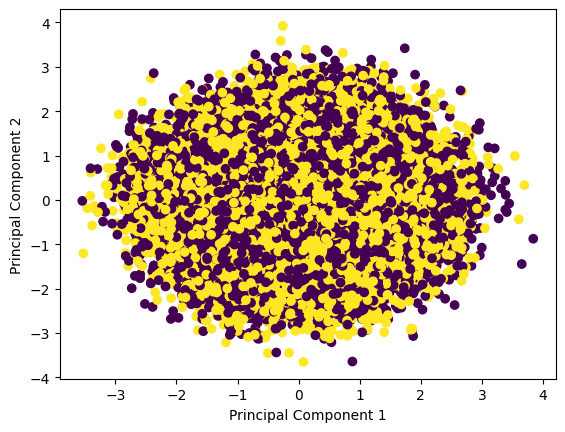

In [26]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import datasets
from sklearn.metrics import accuracy_score


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)
X_train_std = (X_train - mean) / std
X_test_std = (X_test - mean) / std


pca = PCA(n_components=6)
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)


plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [27]:
rf_model = RandomForestClassifier(random_state=42)

rf_model.fit(X_train_pca, y_train)

y_pred = rf_model.predict(X_test_pca)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

feature_importance = rf_model.feature_importances_

original_feature_indices = pca.inverse_transform(np.eye(X_train_pca.shape[1]))
feature_importance_original = np.dot(feature_importance, original_feature_indices)

print('Feature Importance:')
for feature, importance in enumerate(feature_importance_original):
    print(f'Feature {feature + 1}: {importance:.4f}')

Accuracy: 50.35%
Feature Importance:
Feature 1: 0.2158
Feature 2: -0.1084
Feature 3: -0.0861
Feature 4: 0.0635
Feature 5: 0.0285
Feature 6: -0.1616
Feature 7: -0.0212
Feature 8: -0.1364
Feature 9: -0.0329
Feature 10: -0.1592
Feature 11: 0.1564


In [28]:

logistic_model = LogisticRegression(random_state=42)


logistic_model.fit(X_train_pca, y_train)



y_pred = logistic_model.predict(X_test_pca)


accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {(accuracy) * 100:.2f}%')


Accuracy: 60.63%


In [29]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

svm_model = SVC(kernel='linear', C=1.0, random_state=42)

svm_model.fit(X_train_pca, y_train)

y_pred = svm_model.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy * 100:.2f}%')
print('Classification Report:\n', classification_rep)

Accuracy: 49.92%
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00      5008
           1       0.50      1.00      0.67      4992

    accuracy                           0.50     10000
   macro avg       0.25      0.50      0.33     10000
weighted avg       0.25      0.50      0.33     10000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [30]:
from sklearn.naive_bayes import GaussianNB
naive_bayes_model = GaussianNB()

naive_bayes_model.fit(X_train, y_train)

y_pred = naive_bayes_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy * 100:.2f}%')
print('Classification Report:\n', classification_rep)

Accuracy: 50.22%
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.37      0.43      5008
           1       0.50      0.64      0.56      4992

    accuracy                           0.50     10000
   macro avg       0.50      0.50      0.49     10000
weighted avg       0.50      0.50      0.49     10000



In [31]:
from sklearn.naive_bayes import GaussianNB
naive_bayes_model = GaussianNB()

naive_bayes_model.fit(X_train_pca, y_train)

y_pred = naive_bayes_model.predict(X_test_pca)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy * 100:.2f}%')
print('Classification Report:\n', classification_rep)

Accuracy: 49.92%
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.37      0.42      5008
           1       0.50      0.63      0.56      4992

    accuracy                           0.50     10000
   macro avg       0.50      0.50      0.49     10000
weighted avg       0.50      0.50      0.49     10000



In [ ]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.datasets import make_classification

for i in range(1,10):
  degree = i
  poly_features = PolynomialFeatures(degree=degree)
  X_train_poly = poly_features.fit_transform(X_train)
  X_test_poly = poly_features.transform(X_test)

  scaler = StandardScaler()
  X_train_poly = scaler.fit_transform(X_train_poly)
  X_test_poly = scaler.transform(X_test_poly)

  logistic_model = LogisticRegression(random_state=42)

  logistic_model.fit(X_train_poly, y_train)

  y_pred = logistic_model.predict(X_test_poly)

  accuracy = accuracy_score(y_test, y_pred)
  print(f'Accuracy: {accuracy * 100:.2f}%')


Accuracy: 50.09%
Accuracy: 49.65%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 49.30%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 48.79%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 48.90%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 49.43%


In [ ]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.datasets import make_classification


degree = 7
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train_pca)
X_test_poly = poly_features.transform(X_test_pca)

scaler = StandardScaler()
X_train_poly = scaler.fit_transform(X_train_poly)
X_test_poly = scaler.transform(X_test_poly)

logistic_model = LogisticRegression(random_state=42)

logistic_model.fit(X_train_poly, y_train)

y_pred = logistic_model.predict(X_test_poly)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

xgb_model = XGBClassifier(random_state=42)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy * 100:.2f}%')
print('Classification Report:\n', classification_rep)
